## Imports


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandapower as pp
import seaborn as sns
import pandas as pd

import julia
julia.install()

from julia.api import Julia
jl = Julia(compiled_modules=False)

[ Info: Julia version info


Julia Version 1.6.0
Commit f9720dc2eb (2021-03-24 12:55 UTC)
Platform Info:
  OS: Linux (x86_64-pc-linux-gnu)
      "Manjaro Linux"
  uname: Linux 6.6.30-2-MANJARO #1 SMP PREEMPT_DYNAMIC Wed May  8 17:46:43 UTC 2024 x86_64 unknown
  CPU: 13th Gen Intel(R) Core(TM) i5-13400F: 
                 speed         user         nice          sys         idle          irq
       #1-16  4313 MHz  112390592 s       2811 s    1776442 s  271909940 s     420153 s
       
  Memory: 62.63358688354492 GB (5426.4453125 MB free)
  Uptime: 2.41873e6 sec
  Load Avg:  2.73  3.2  3.0
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-11.0.1 (ORCJIT, goldmont)
Environment:
  HOME = /home/iboero
  CUDA_PATH = /opt/cuda
  PATH = /home/iboero/miniconda3/envs/proy/bin:/home/iboero/.vscode-server/cli/servers/Stable-e170252f762678dec6ca2cc69aba1570769a5d39/server/bin/remote-cli:/home/iboero/miniconda3/envs/proy/bin:/home/iboero/miniconda3/condabin:/home/iboero/.local/bin:/usr/local/sbin:/usr/local/bin:/usr/bin:/opt

[ Info: Julia executable: /home/iboero/julia/bin/julia
[ Info: Trying to import PyCall...
┌ Info: PyCall is already installed and compatible with Python executable.
│ 
│ PyCall:
│     python: /home/iboero/miniconda3/envs/proy/bin/python
│     libpython: /home/iboero/miniconda3/envs/proy/lib/libpython3.11.so.1.0
│ Python:
│     python: /home/iboero/miniconda3/envs/proy/bin/python
└     libpython: 


## Levantar los datos

In [31]:
# net = pp.from_pickle("./red_uru.p")
net = pp.from_pickle("/home/iboero/Tesis/crear_modelo_uy/GNN4OPF/modelos_pp/uy_pp_net_v14_(sin_eolico_ni_solar).p")

input_path = f'./reduru/input.npy'
vm_path = f'./reduru/vm_pu_opt.npy'
q_shunt_path = f'./reduru/q_switch_shunt_opt.npy'
q_gen_path = f'./reduru/q_mvar_opt.npy'


x = np.load(input_path)
vm = np.load(vm_path).squeeze()
q_shunt =  np.load(q_shunt_path).squeeze()
q_gen =  np.load(q_gen_path).squeeze()


print("Tenemos {} muestras".format(x.shape[0]))


# Create a map from net.bus.index to the position of the bues
bus_map = {net.bus.index[i]: i for i in range(len(net.bus))}


# That also works for a list of buses
def bus_pos(buses):
    try:
        return [bus_map[bus] for bus in buses]
    except:
        return bus_map[buses]

Tenemos 18174 muestras


## Metadata Red
 


In [32]:
idx_gen = bus_pos(net.gen.bus.values)
idx_shunt = bus_pos(net.sgen.bus[net.sgen.controllable==True].values)
idx_load = bus_pos(net.load.bus.values)
idx_ext_grid = bus_pos(net.ext_grid.bus.values)
idx_sgen = bus_pos(net.sgen.bus[net.sgen.controllable==False].values)
print(f"La red tiene {len(net.bus)} buses")
print(f"La red tiene {len(net.line)} lineas")
print(f"La red tiene {len(net.ext_grid)} barras de referencia")
print(f"La red tiene {len(net.gen)} generadores")
print(f"La red tiene {len(net.load)} cargas")

print(f"La red tiene {len(net.shunt)} shunts")
print(f"La red tiene {len(net.trafo)} trafos")
print(f"La red tiene {len(net.switch)} switches")

La red tiene 107 buses
La red tiene 144 lineas
La red tiene 1 barras de referencia
La red tiene 12 generadores
La red tiene 55 cargas
La red tiene 6 shunts
La red tiene 12 trafos
La red tiene 0 switches


## Grafica Entradas

### Carga Activa

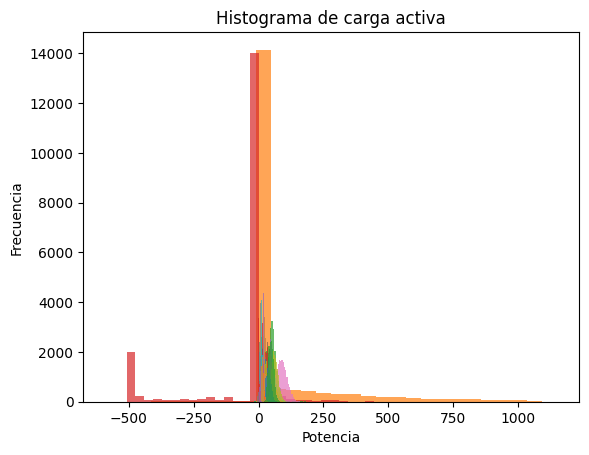

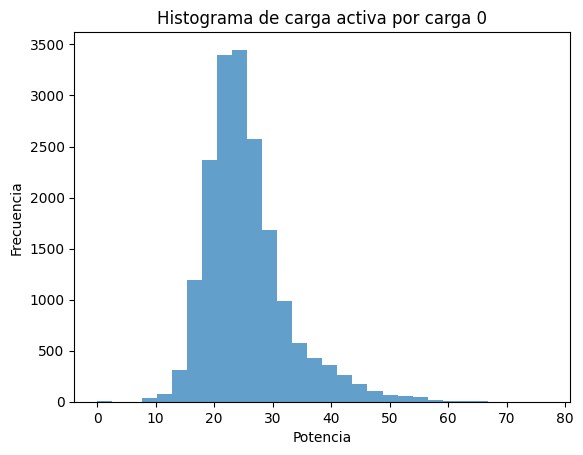

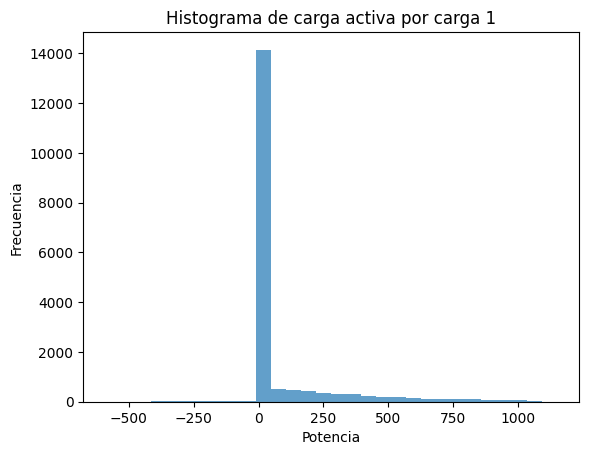

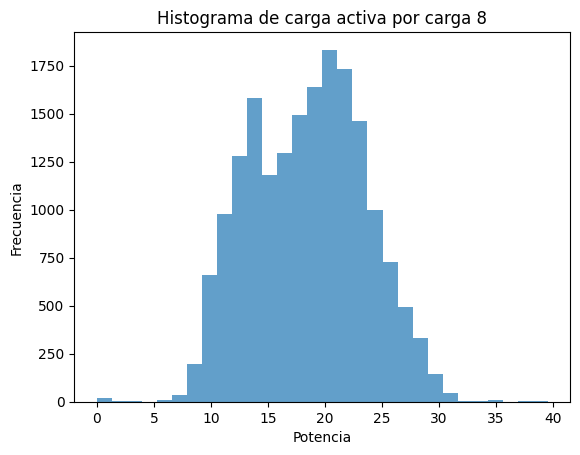

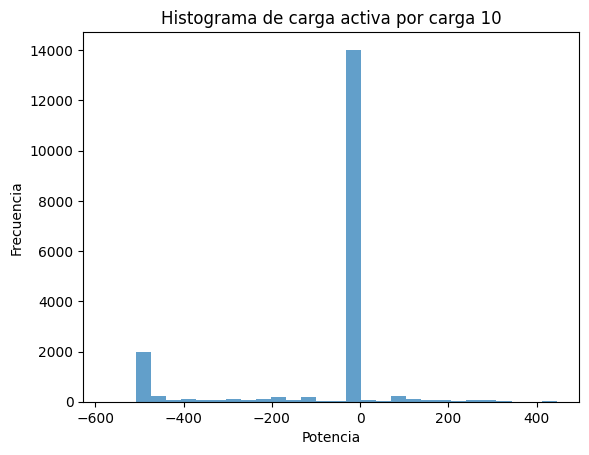

...

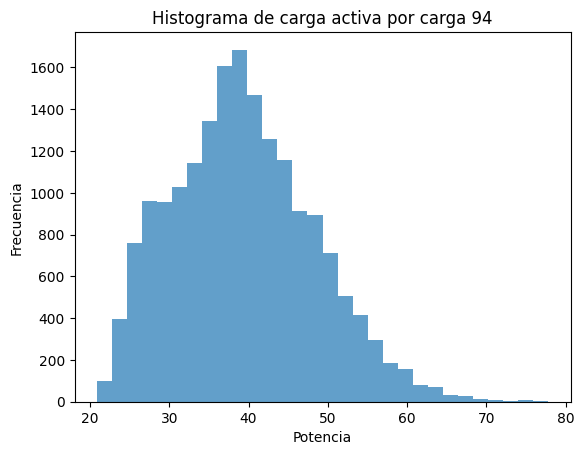

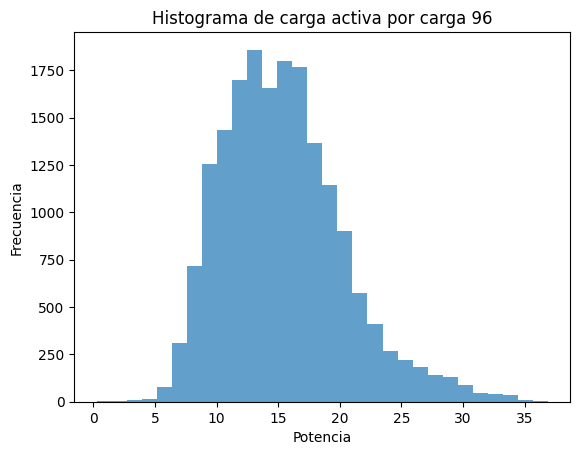

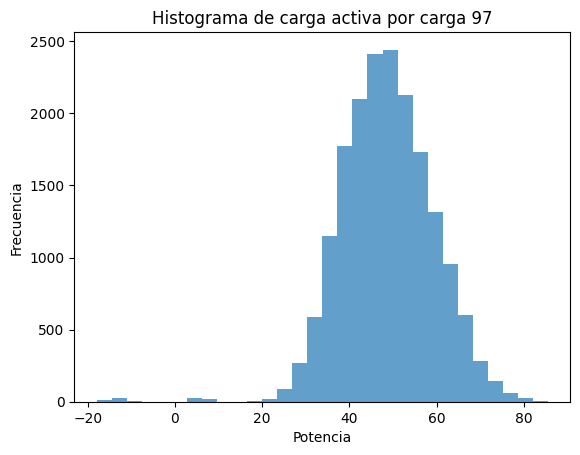

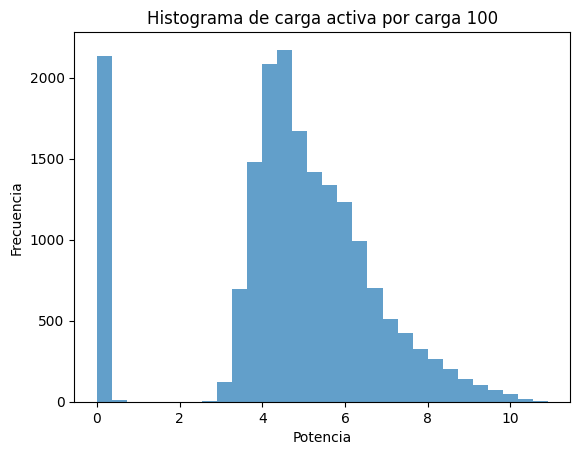

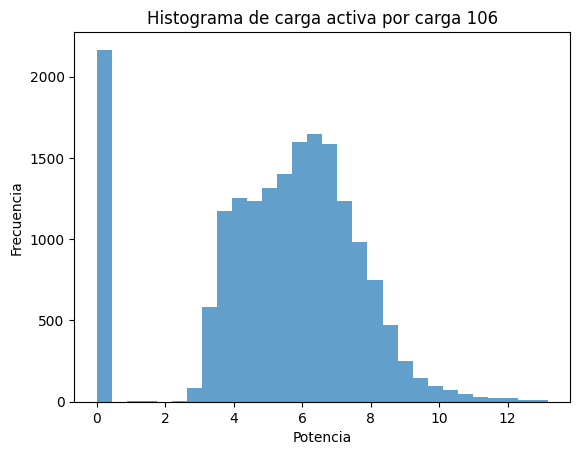

In [5]:
for i in idx_load:
    plt.hist(x[:, i, 0], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga activa')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_load:
    plt.hist(x[:, i, 0], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga activa por carga {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()

### Carga Reactiva

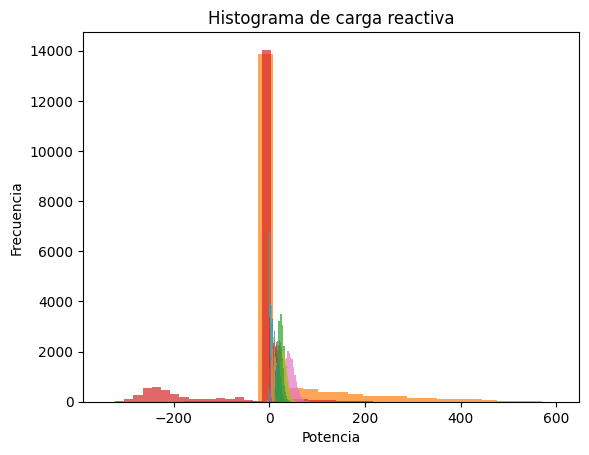

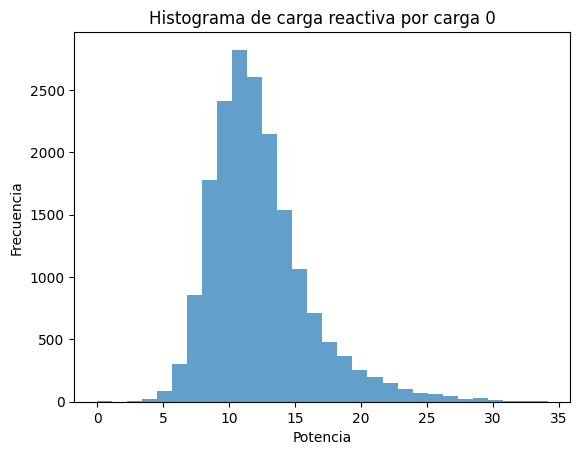

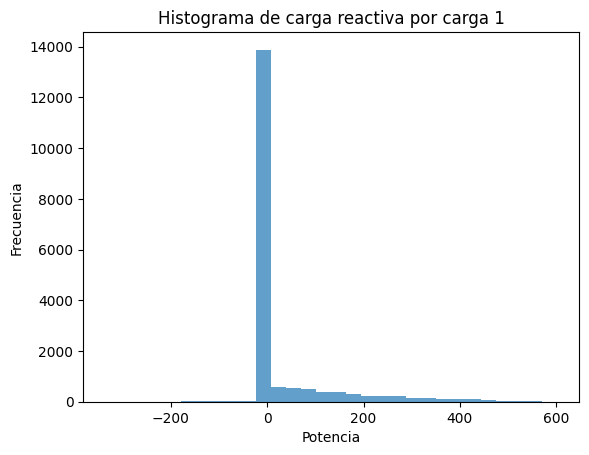

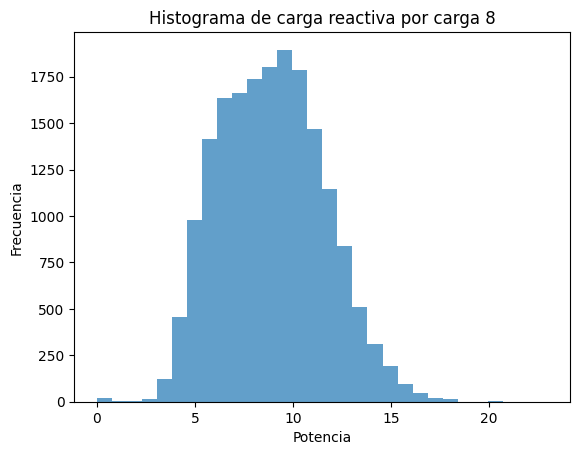

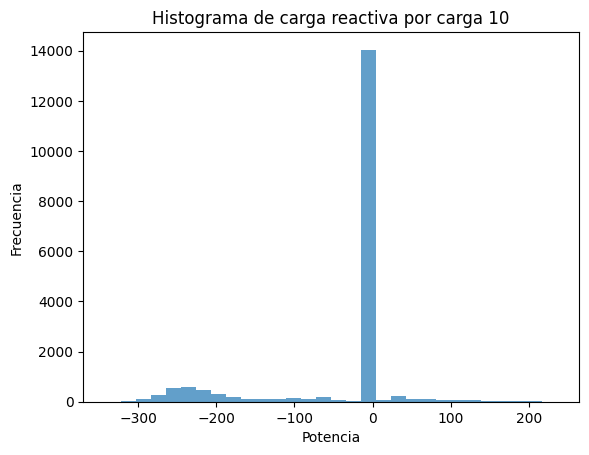

...

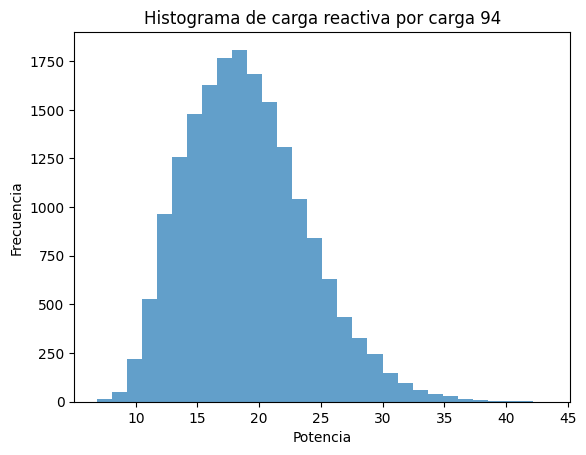

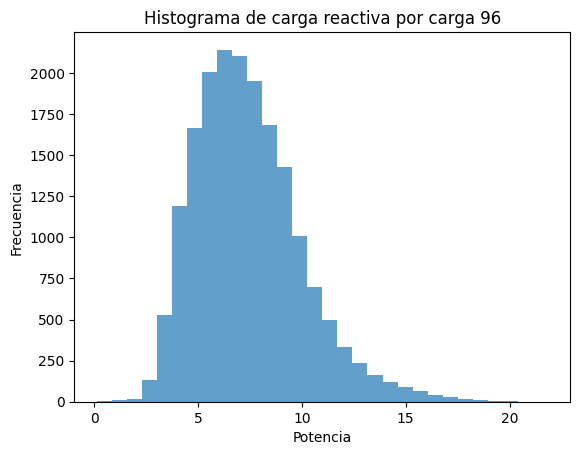

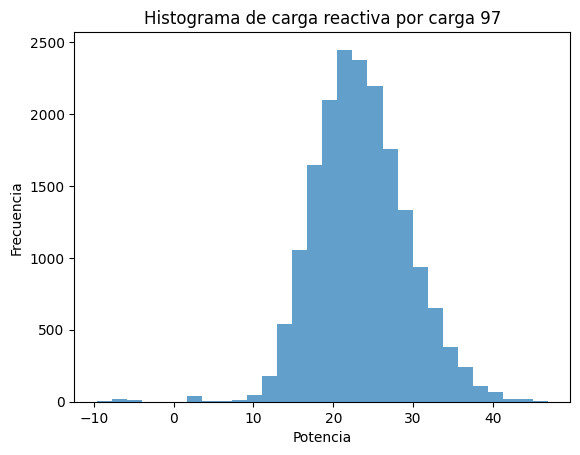

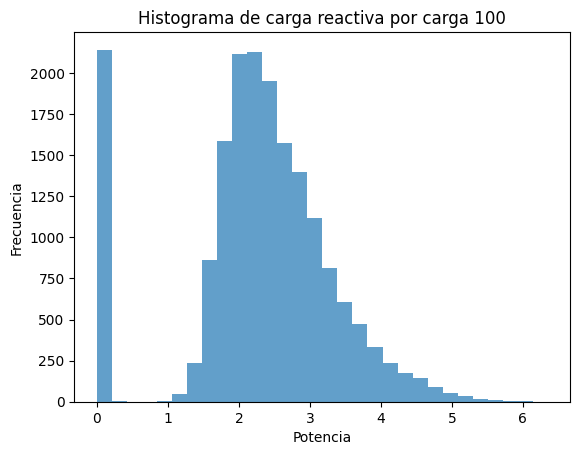

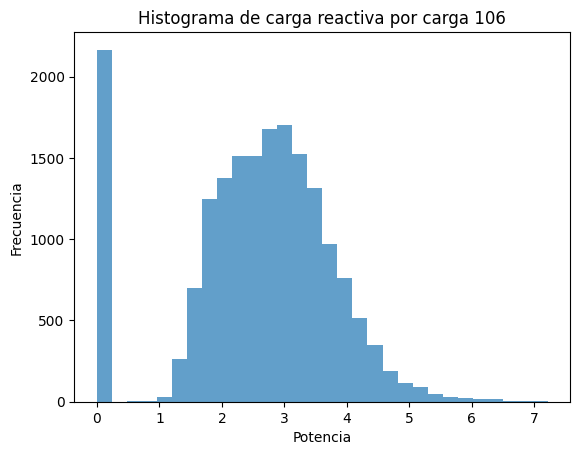

In [6]:
for i in idx_load:
    plt.hist(x[:, i, 1], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga reactiva')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_load:
    plt.hist(x[:, i, 1], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga reactiva por carga {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()

### Generacion Activa Gens

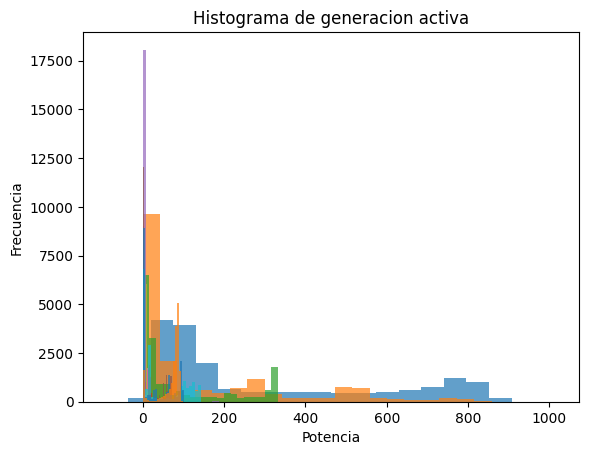

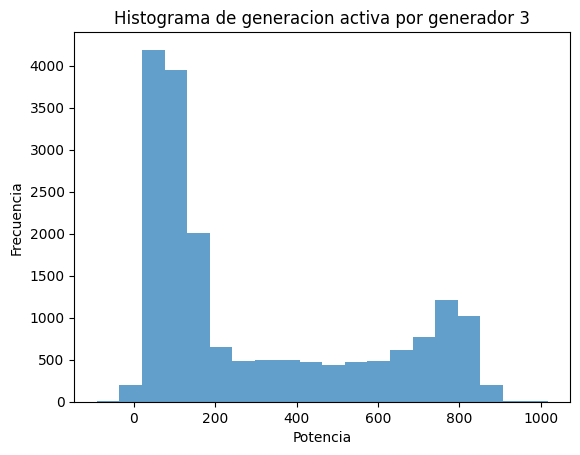

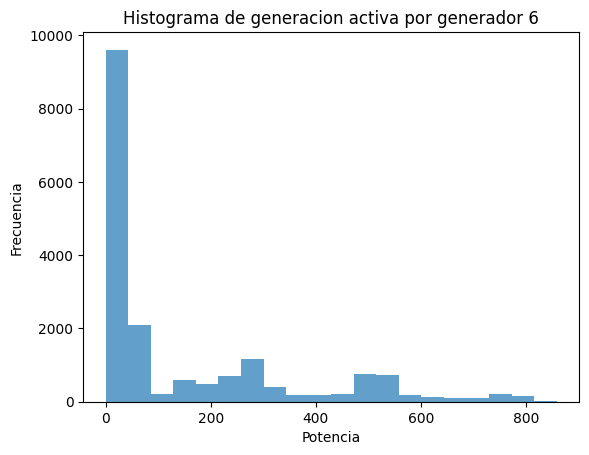

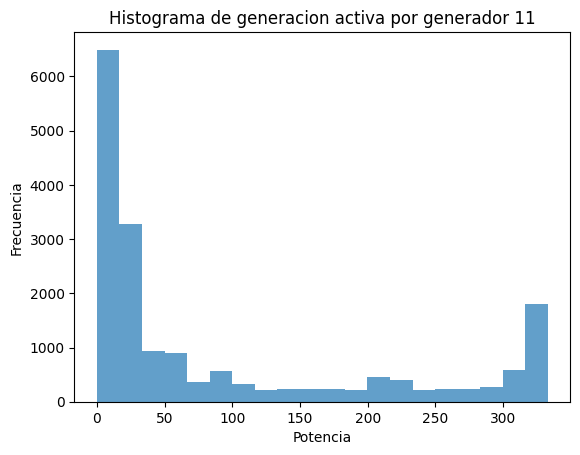

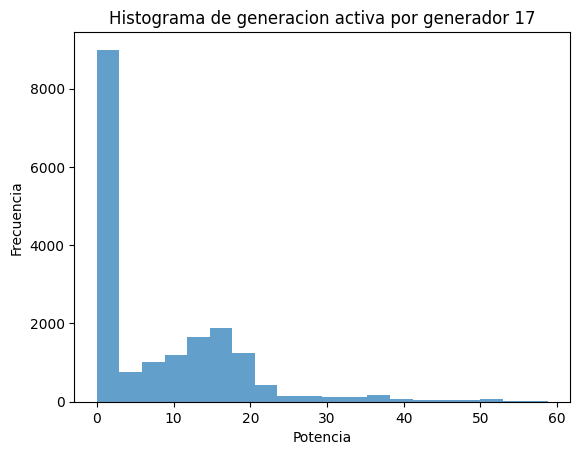

...

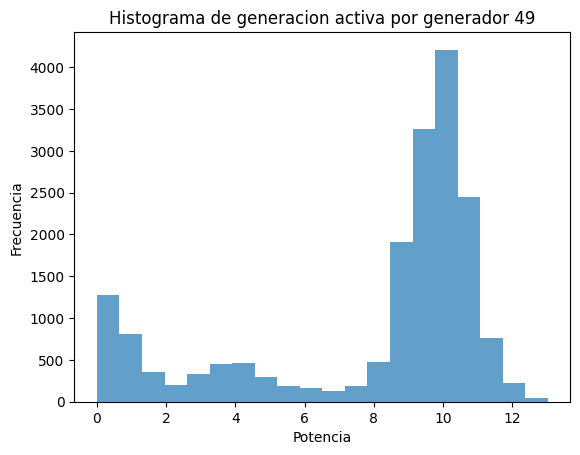

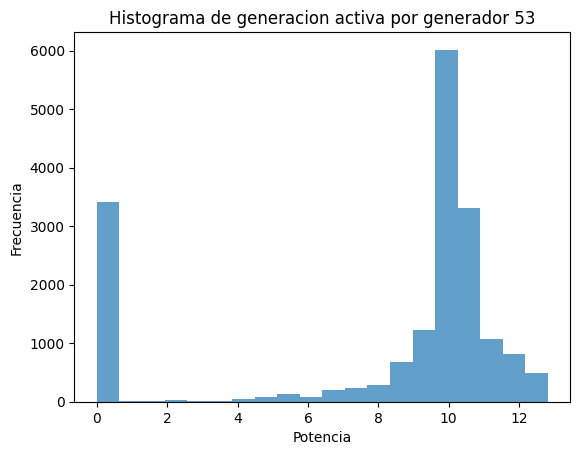

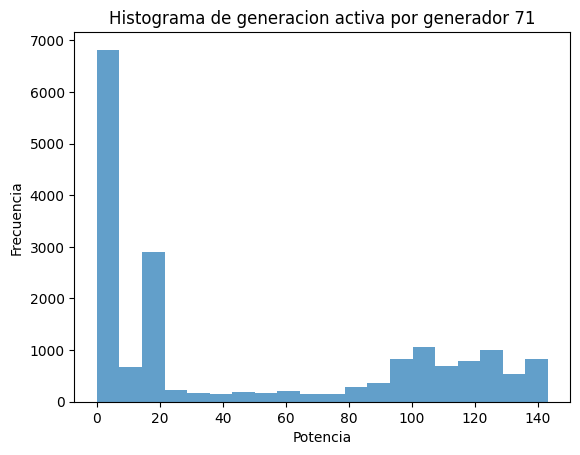

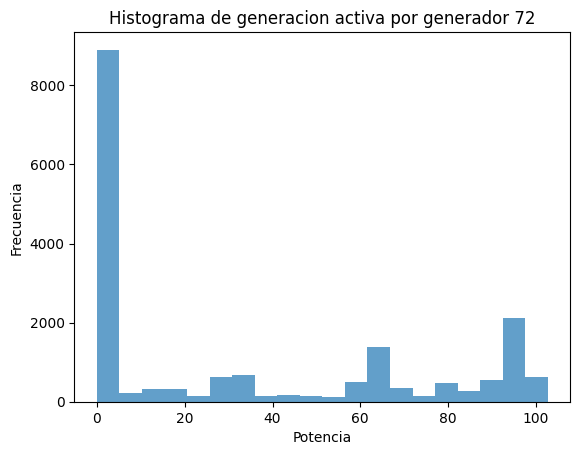

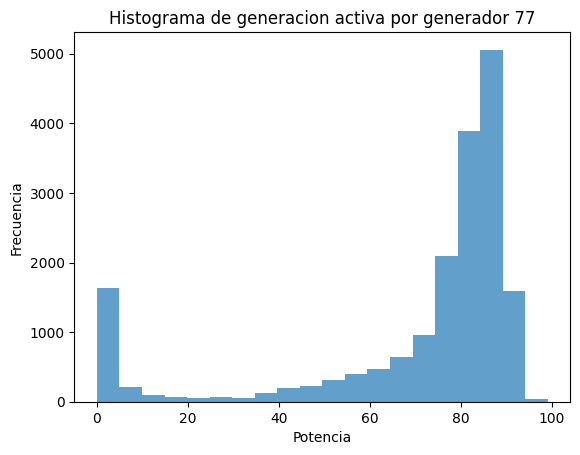

In [7]:
for i in idx_gen:
    plt.hist(x[:, i, 2], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion activa')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_gen:
    plt.hist(x[:, i, 2], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion activa por generador {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()

### Generacion activa sgens

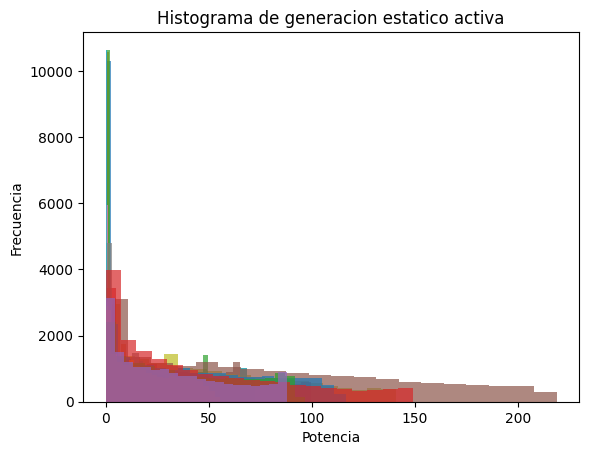

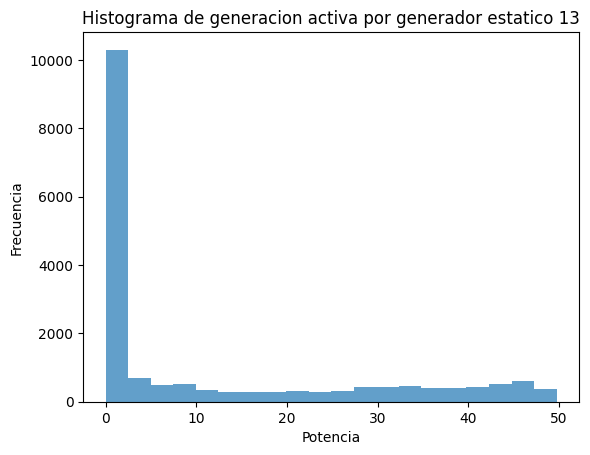

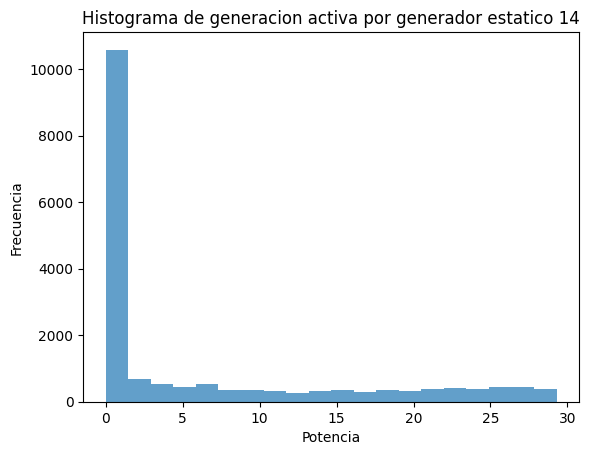

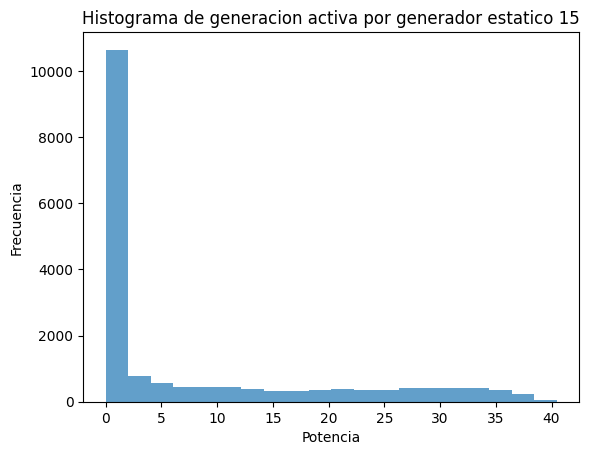

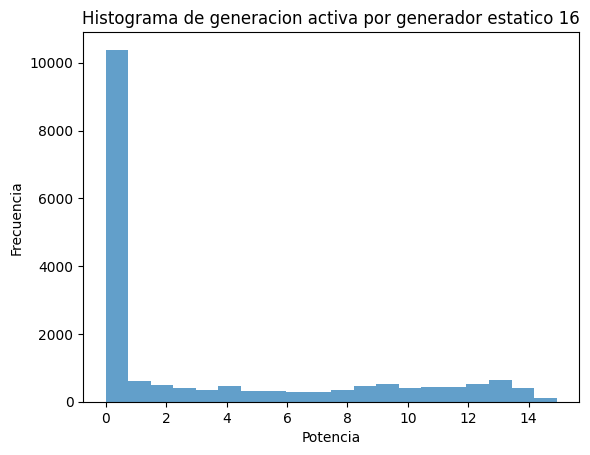

...

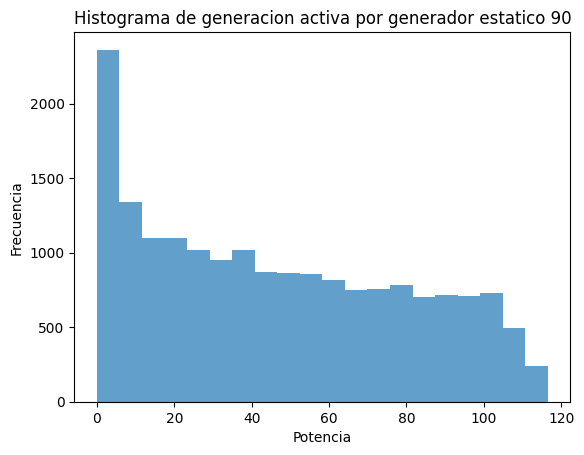

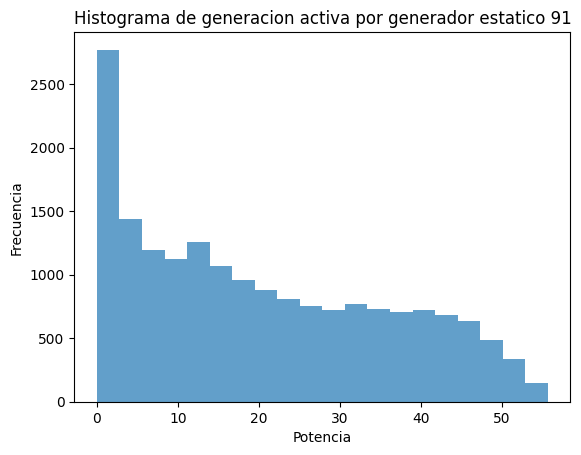

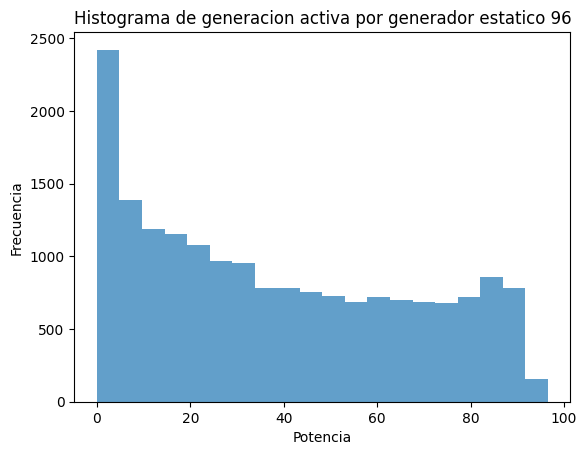

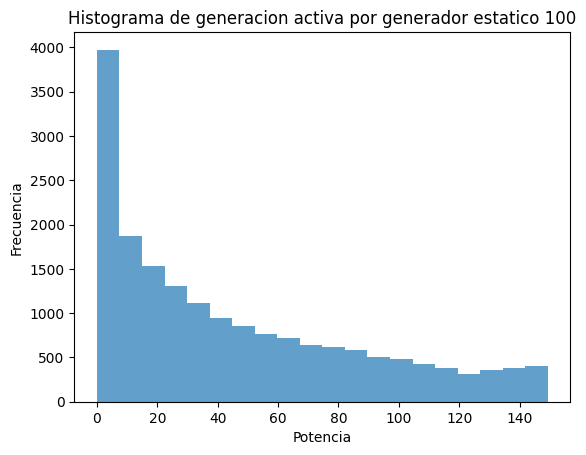

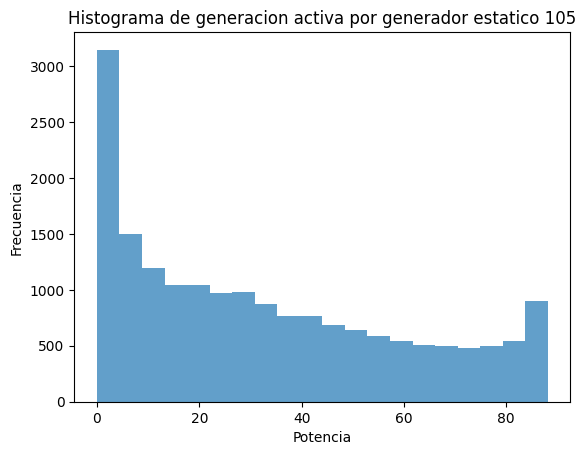

In [8]:
for i in idx_sgen:
    plt.hist(x[:, i, 3], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion estatico activa')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_sgen:
    plt.hist(x[:, i, 3], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion activa por generador estatico {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()

## Grafica Valores optimos

### vm_pu

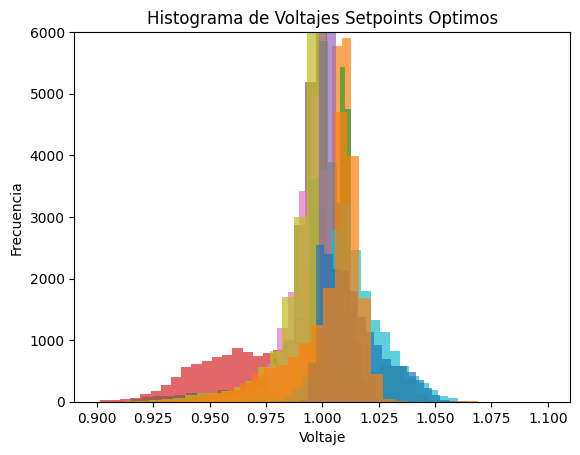

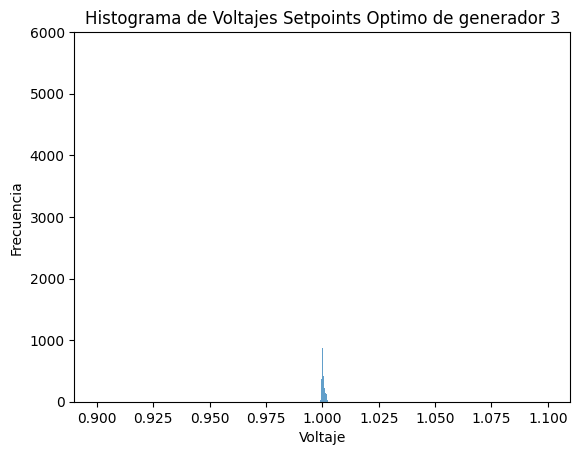

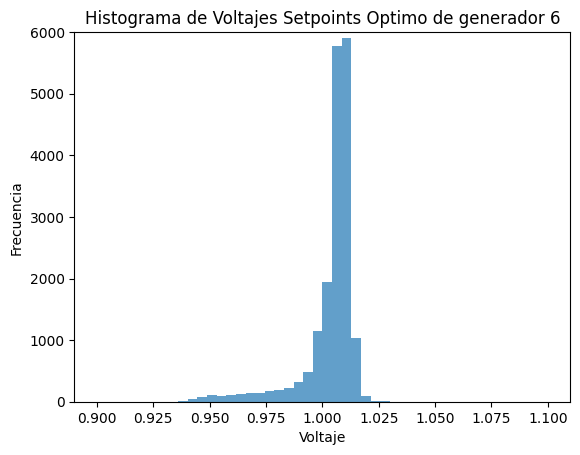

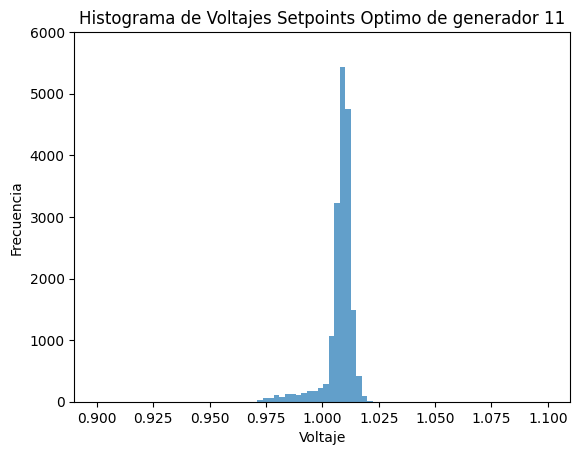

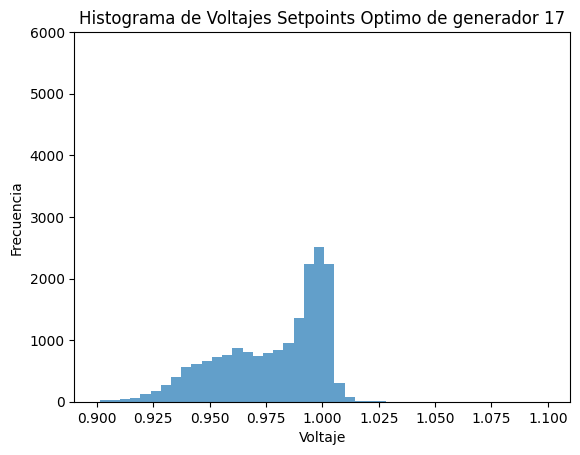

...

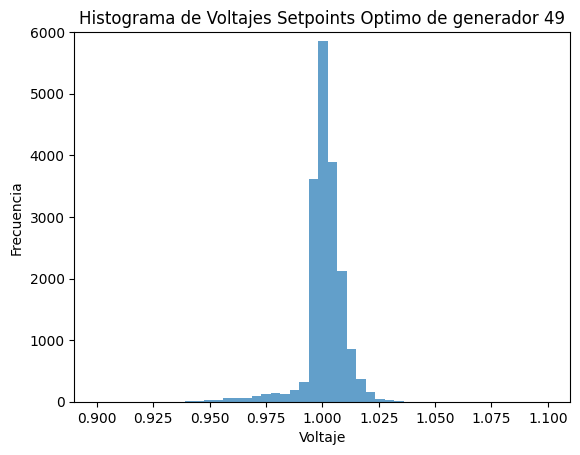

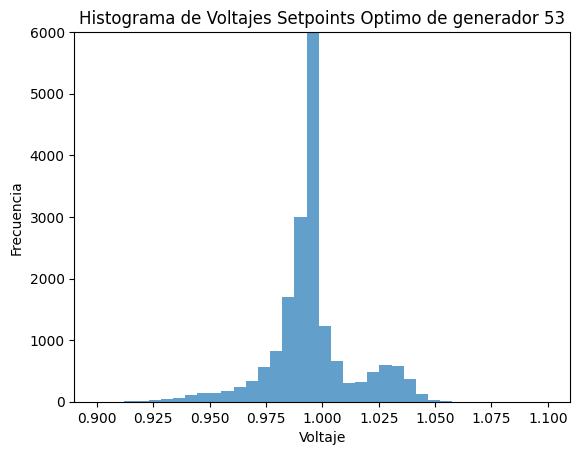

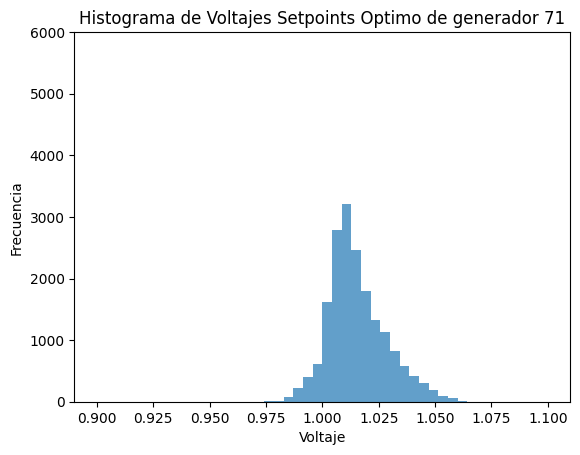

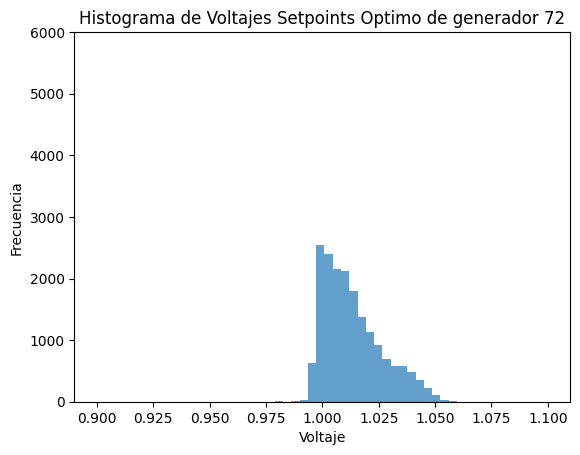

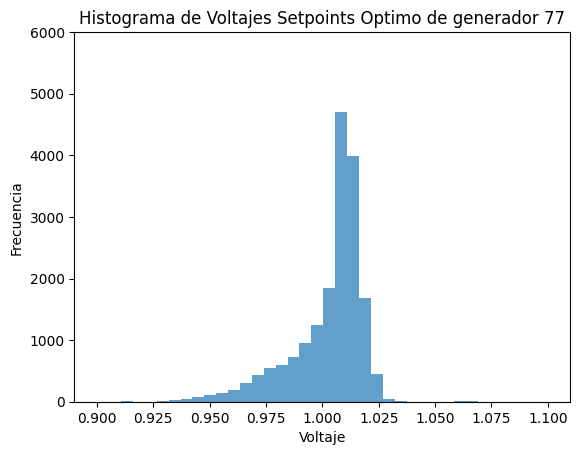

In [9]:

for i in idx_gen:
    plt.hist(vm[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Voltajes Setpoints Optimos')
    plt.xlabel('Voltaje')
    plt.ylabel('Frecuencia')
    plt.xlim(0.89,1.11)
    plt.ylim(0,6000)
plt.show()


for i in idx_gen:
    plt.hist(vm[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Voltajes Setpoints Optimo de generador {i}')
    plt.xlabel('Voltaje')
    plt.ylabel('Frecuencia')
    plt.xlim(0.89,1.11)
    plt.ylim(0,6000)
    plt.show()

### q_gen

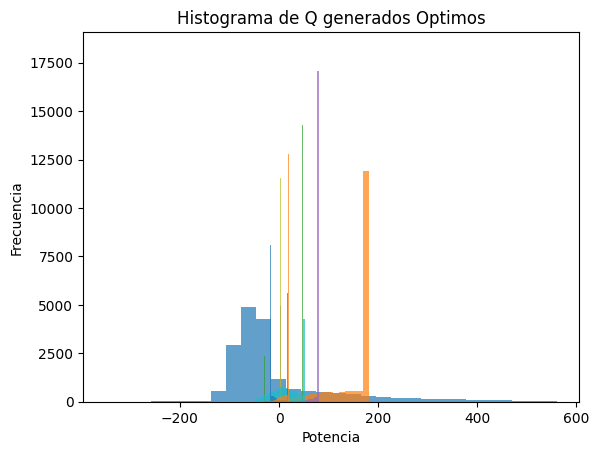

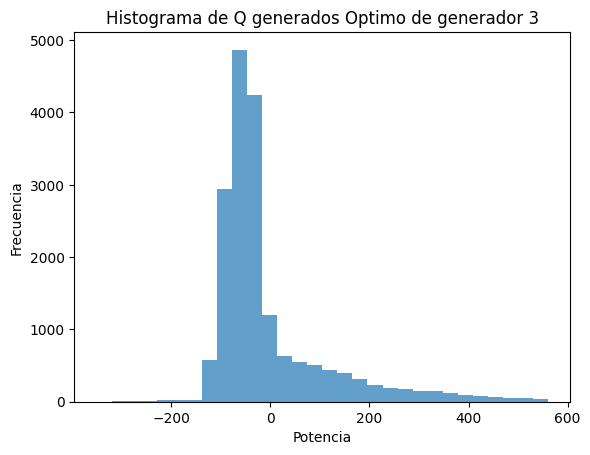

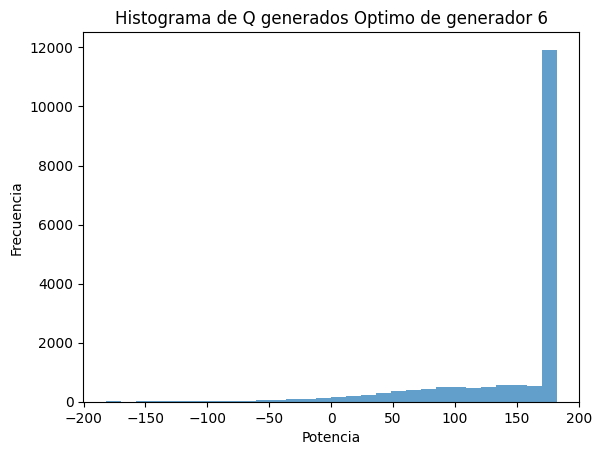

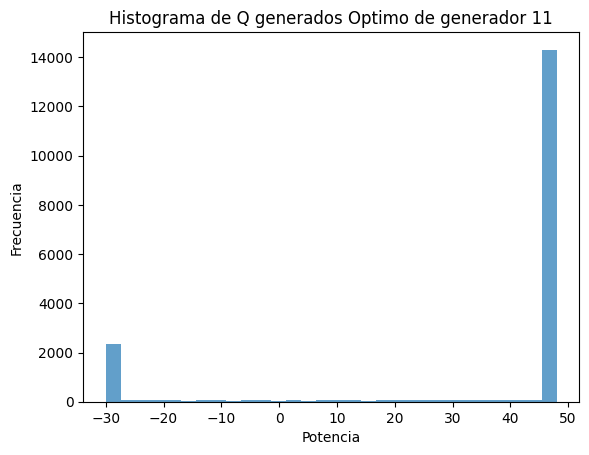

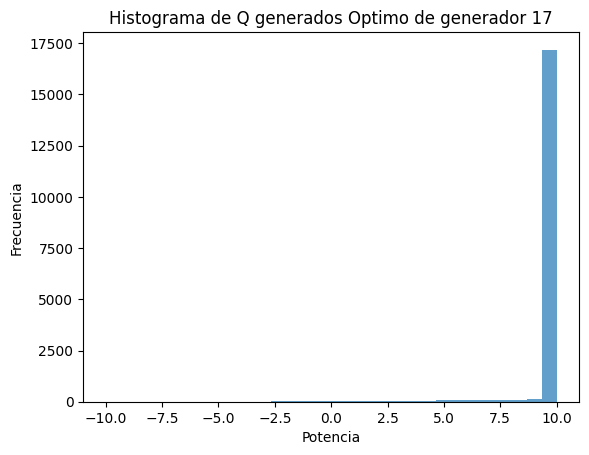

...

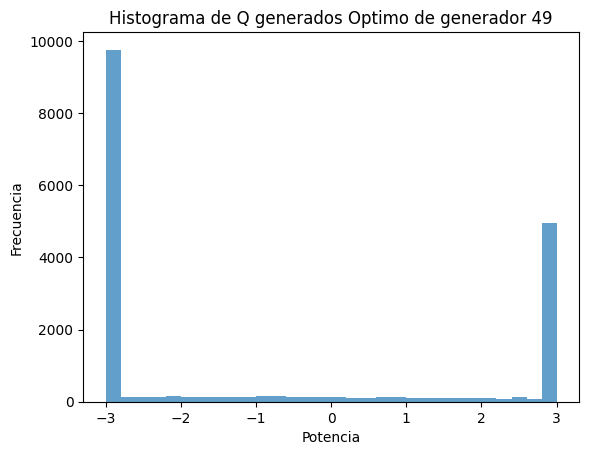

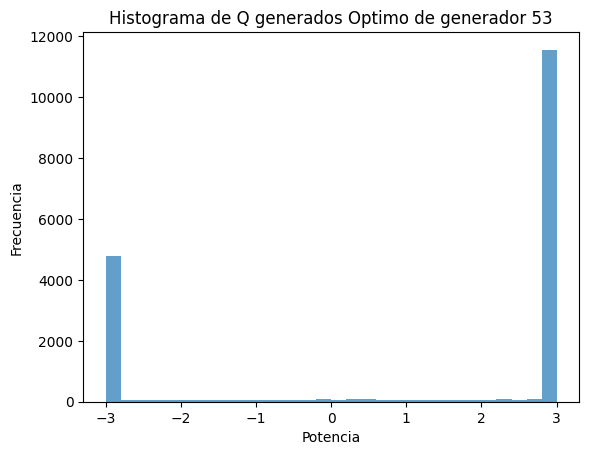

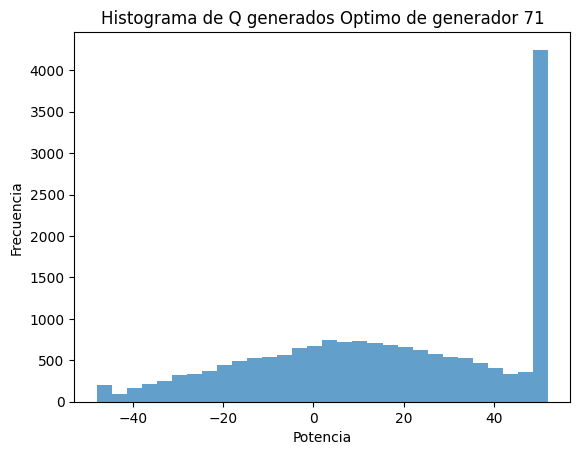

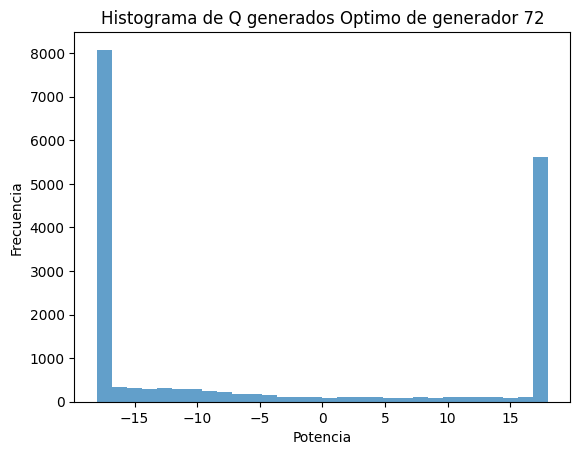

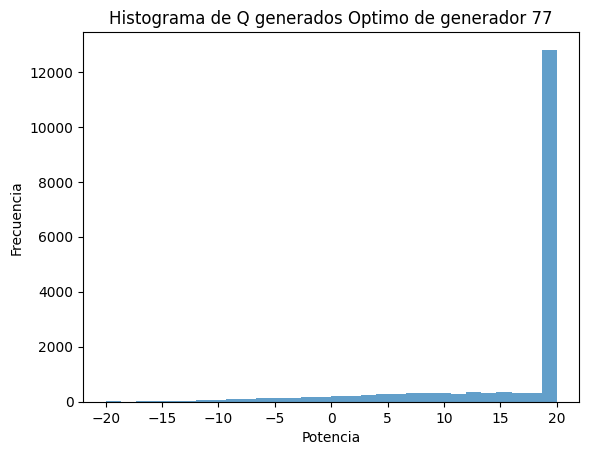

In [10]:
for i in idx_gen:
    plt.hist(q_gen[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Q generados Optimos')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,6000)
plt.show()


for i in idx_gen:
    plt.hist(q_gen[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Q generados Optimo de generador {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,6000)
    plt.show()

### q_shunt


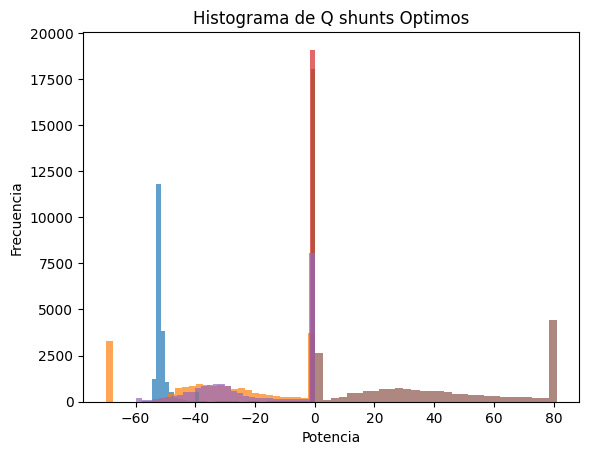

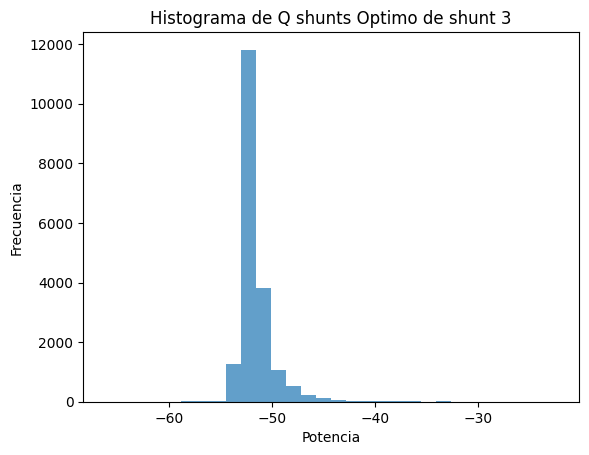

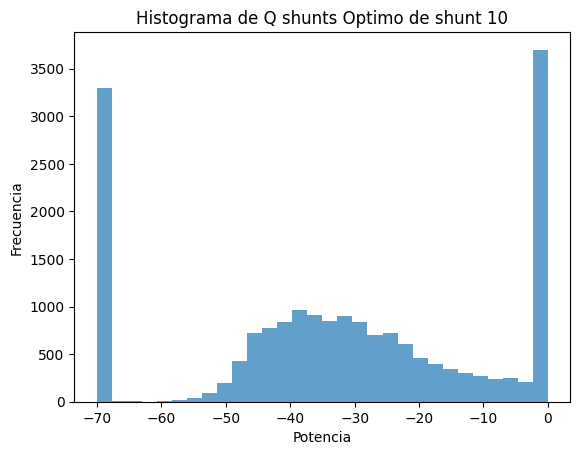

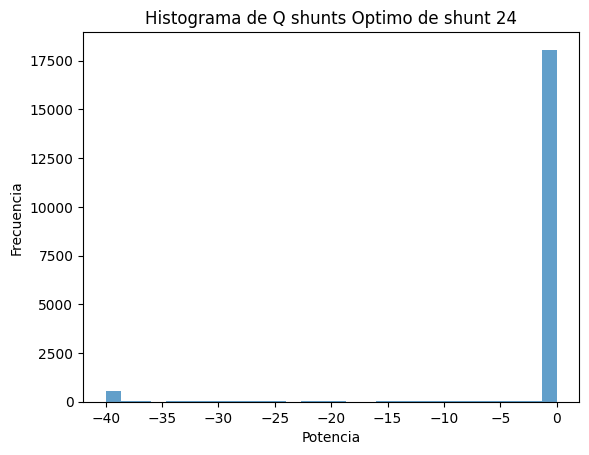

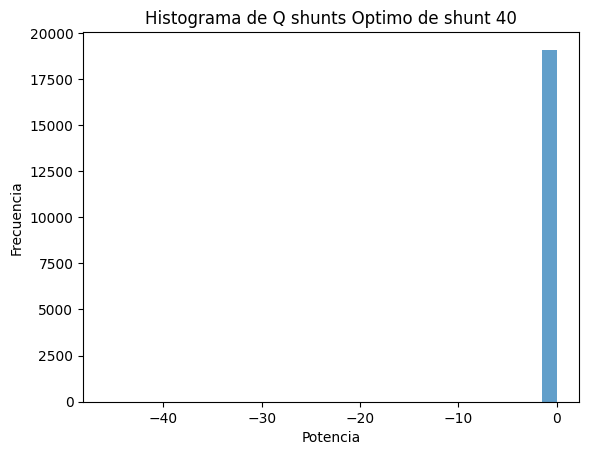

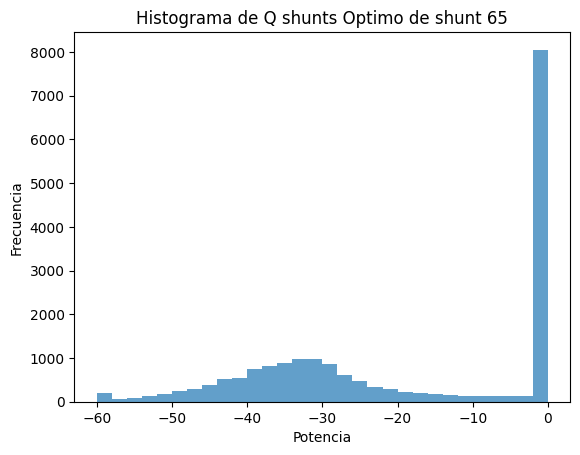

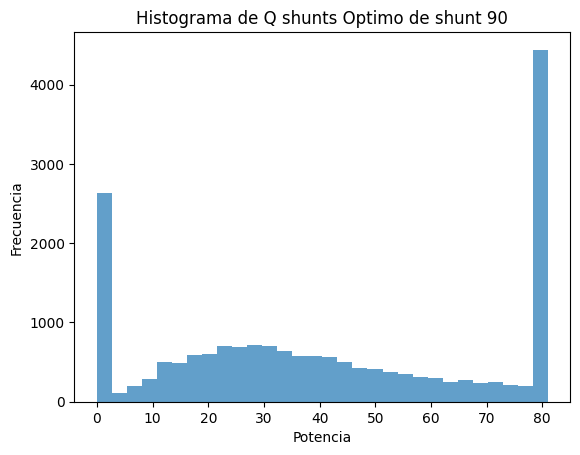

In [37]:
for i in idx_shunt:
    plt.hist(q_shunt[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Q shunts Optimos')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,6000)
plt.show()


for i in idx_shunt:
    plt.hist(q_shunt[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Q shunts Optimo de shunt {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,6000)
    plt.show()

## Verificar Data

In [40]:
gen_idx

array(['90000', '90160', '90500', '92050', '92124', '92240', '92400',
       '92410', '92430', '92540', '92550', '92600'], dtype='<U10')

In [132]:
net = pp.from_pickle("./red_uru.p")
net.line.c_nf_per_km /= 3

In [135]:
from copy import deepcopy

index = 2

gen_idx = net.gen.bus.values
shunt_idx = net.sgen.loc[net.sgen.controllable==True].bus.values
sgen_idx = net.sgen.loc[net.sgen.controllable==False].bus.values
load_idx = net.load.bus.values

net.gen.p_mw = x[index,bus_pos(gen_idx),2]
net.load.p_mw = x[index,bus_pos(load_idx),0]
net.load.q_mvar = x[index,bus_pos(load_idx),1]
net.sgen.p_mw.loc[net.sgen.controllable==False] = x[index,bus_pos(sgen_idx),3]

net.gen.max_p_mw = net.gen.p_mw 
net.gen.min_p_mw = net.gen.p_mw


net_opt = deepcopy(net)
net_opt.bus["pm_param/setpoint_v"] = 1.0

pp.runpm_vstab(net_opt)



print(net_opt.res_gen.vm_pu.values)
print(vm[index,bus_pos(gen_idx)])

print(net_opt.res_sgen.loc[net.sgen.controllable==True].q_mvar.values)
print(q_shunt[index,bus_pos(shunt_idx)])

/tmp/ipykernel_138596/1649384908.py:13: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  net.sgen.p_mw.loc[net.sgen.controllable==False] = x[index,bus_pos(sgen_idx),3]
no costs are given - overall generated power is minimized


[0.99990496 1.00491962 1.00429159 0.99700385 1.0041325  0.99787793
 0.9932889  0.99827086 0.99378741 1.0036928  0.99852727 1.00750651]
[0.99990496 1.00491962 1.00429159 0.99700385 1.0041325  0.99787793
 0.9932889  0.99827086 0.99378741 1.0036928  0.99852727 1.00750651]
[-5.14347531e+01 -2.61548490e+01 -3.85857179e-03 -7.76048610e-04
 -4.20494627e+01  3.66177227e+01]
[-5.14347531e+01 -2.61548490e+01 -3.85857179e-03 -7.76048610e-04
 -4.20494627e+01  3.66177227e+01]


In [136]:
net.sgen.q_mvar.loc[net.sgen.controllable==True] = q_shunt[index,bus_pos(shunt_idx)]
net.gen.vm_pu = vm[index,bus_pos(gen_idx)]

pp.runpp(net)



/tmp/ipykernel_138596/1160163879.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  net.sgen.q_mvar.loc[net.sgen.controllable==True] = q_shunt[index,bus_pos(shunt_idx)]


In [140]:
net_opt.res_line

,p_hv_mw,q_hv_mvar,p_lv_mw,q_lv_mvar,pl_mw,ql_mvar,i_hv_ka,i_lv_ka,vm_hv_pu,va_hv_degree,vm_lv_pu,va_lv_degree,loading_percent
0,-6.757392,5.657263,6.758551,-5.588302,0.001159,0.068961,0.010177,0.033924,0.999905,0.022579,0.995002,0.372904,7.344072
1,-23.307991,19.496836,23.311887,-19.259055,0.003896,0.237782,0.035092,0.116972,0.999905,0.022579,0.995002,0.372904,11.870046
2,-8.998687,4.920719,9.001175,-4.847564,0.002488,0.073154,0.011789,0.039297,1.004554,-0.381222,1.001350,-0.014817,6.837473
3,42.112968,31.164776,-42.110527,-31.021744,0.002441,0.143032,0.060328,0.201094,1.002768,-1.973142,1.001104,-2.097499,12.327133
4,45.101504,29.816034,-45.091176,-29.668767,0.010329,0.147267,0.062258,0.207526,1.002768,-1.973142,1.001104,-2.097499,12.721432
5,10.408992,24.827488,-10.408263,-24.777842,0.000729,0.049646,0.030986,0.103288,1.003210,-1.925981,1.001494,-1.965472,6.334401
6,11.475664,24.200496,-11.472679,-24.151189,0.002985,0.049307,0.030828,0.102760,1.003210,-1.925981,1.001494,-1.965472,6.301996
7,40.850735,26.702314,-40.849601,-26.306916,0.001134,0.395398,0.056207,0.187357,1.002607,-2.083525,0.998166,-2.473081,17.962329
8,40.850735,26.702314,-40.849601,-26.306916,0.001134,0.395398,0.056207,0.187357,1.002607,-2.083525,0.998166,-2.473081,17.962329
9,-33.760752,14.027771,33.772134,-13.662568,0.011383,0.365203,0.042009,0.140031,1.004893,-1.543369,1.001374,-1.006094,14.623634


In [137]:
net.res_bus

,vm_pu,va_degree,p_mw,q_mvar
101,0.998171,-3.073195,13.213126,6.570285
4000,1.000000,0.000000,60.679888,17.895673
4004,1.004504,-0.340334,0.000000,0.000000
90000,0.999905,0.022372,-103.450000,58.146784
90080,1.004552,-0.387303,0.000000,0.000000
90100,1.002909,-1.984089,0.000000,-3.327271
90160,1.004920,-1.828312,-21.729000,-66.684052
90180,1.004431,-1.643378,0.000000,0.000000
90200,1.003309,-1.936586,15.274316,3.802960
90300,1.002796,-2.094814,0.000000,-2.680930


## Análisis serie temporal

In [4]:
gen_p = pd.read_csv("./crudo/GENP_total_pandapower.csv")
load_p = pd.read_csv("./crudo/LOADP_total_pandapower.csv")

bus_map = {net.bus.index[i]: i for i in range(len(net.bus))}

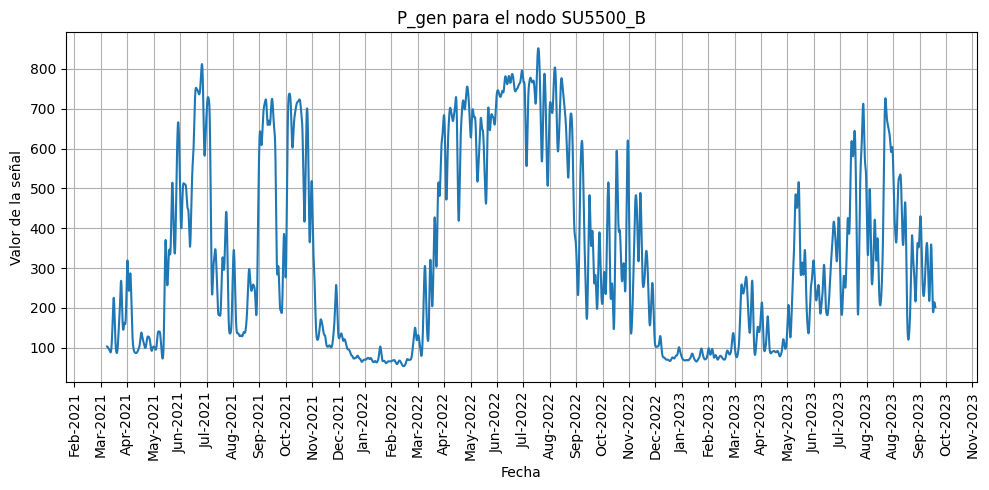

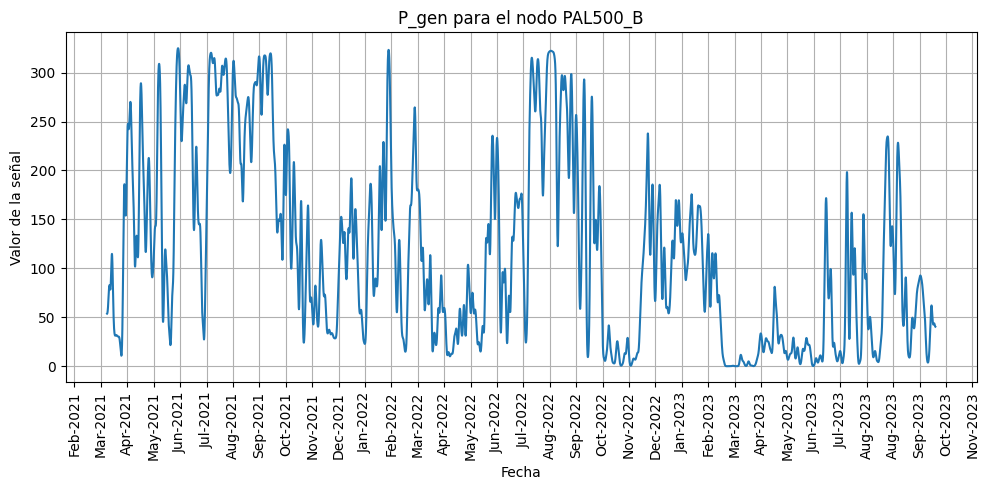

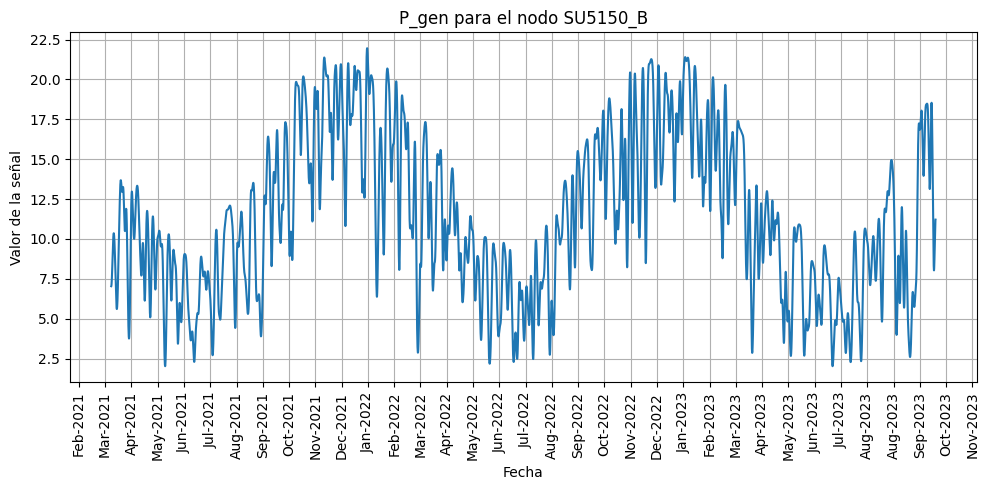

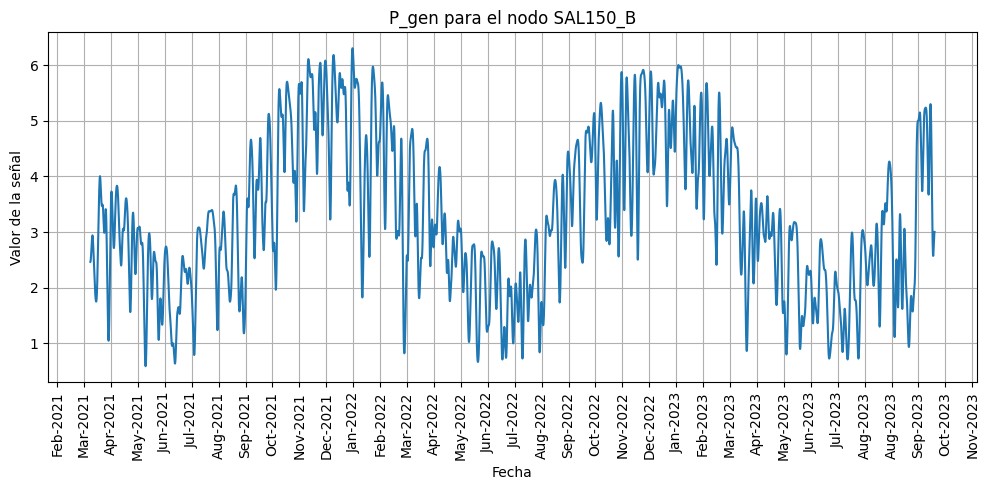

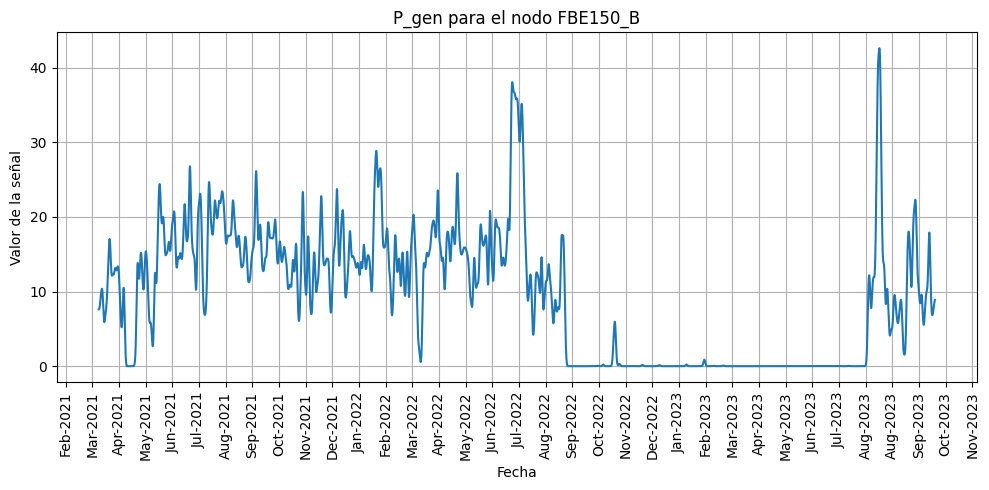

...

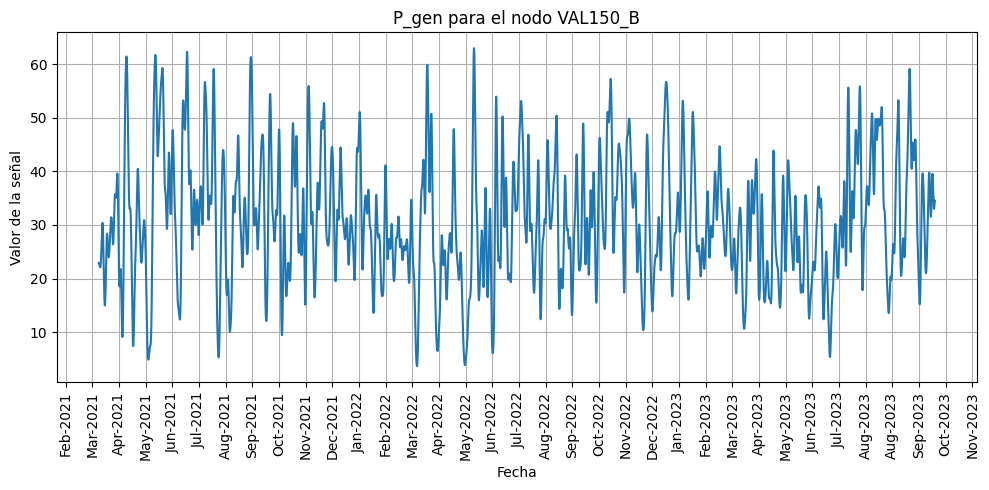

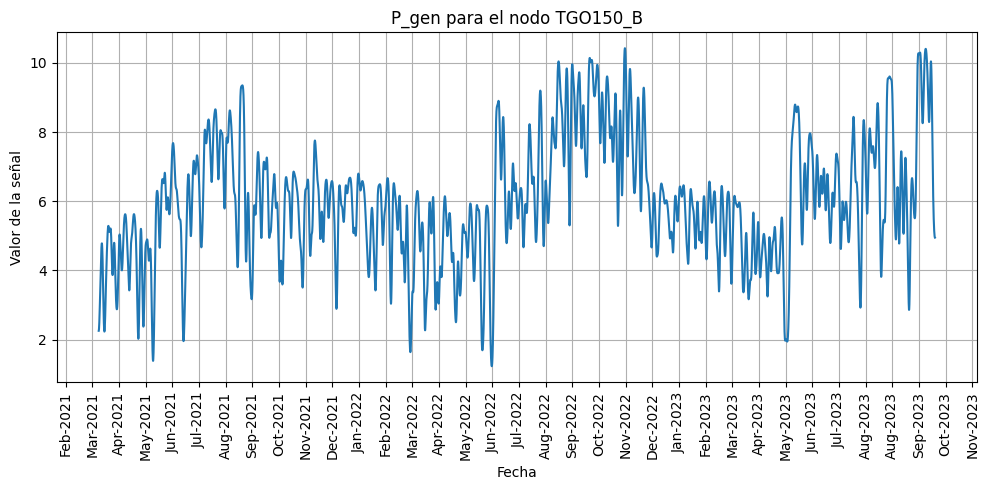

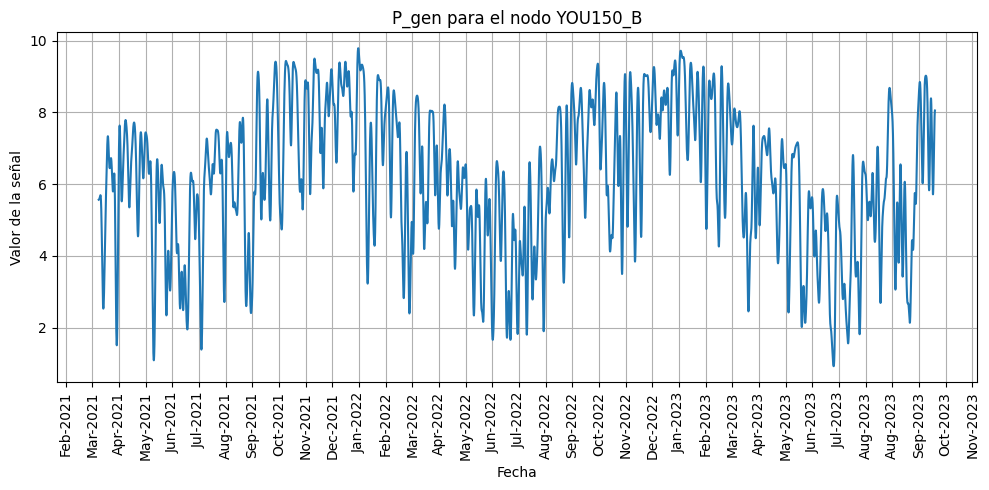

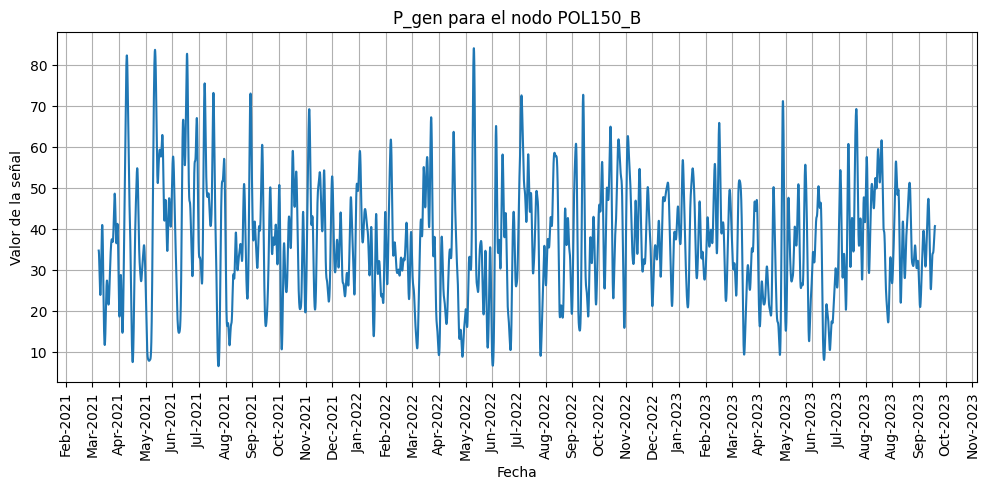

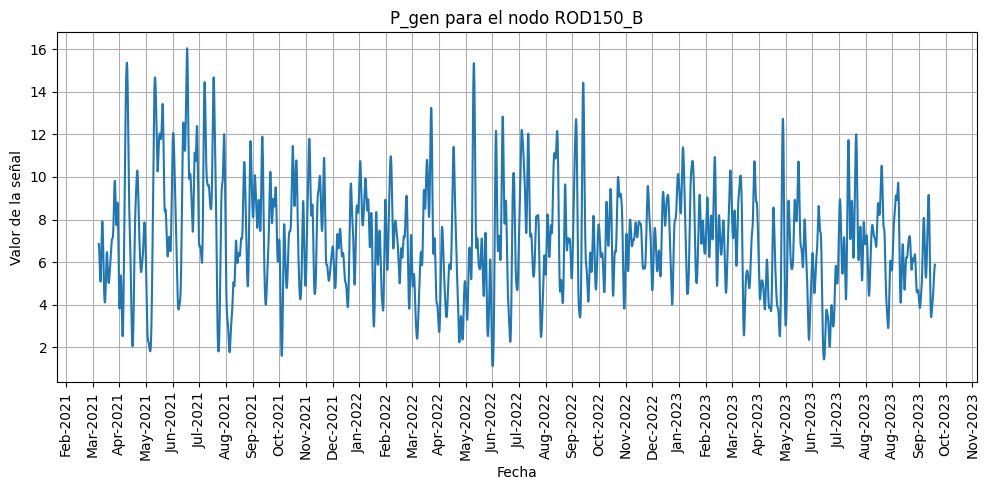

In [66]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

gen_p['Fecha'] = pd.to_datetime(gen_p['Fecha'])

for column in gen_p.columns[1:]:
    plt.figure(figsize=(10, 5))
    
    smoothed_signal = gaussian_filter1d(gen_p[column], sigma=50)
    
    plt.plot(gen_p['Fecha'], smoothed_signal)
    
    plt.title(f'P_gen para el nodo {net.bus.loc[int(column)].values[0]}')
    plt.xlabel('Fecha')
    plt.ylabel('Valor de la señal')
    plt.grid(True)
    
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))  
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))  
    
    plt.xticks(rotation=90)  
    plt.tight_layout()  
    plt.show()

In [34]:
p_gen = x[:, idx_sgen + idx_gen, 2:].sum(axis=2)
p_load = x[:, idx_load, :2].sum(axis=2)

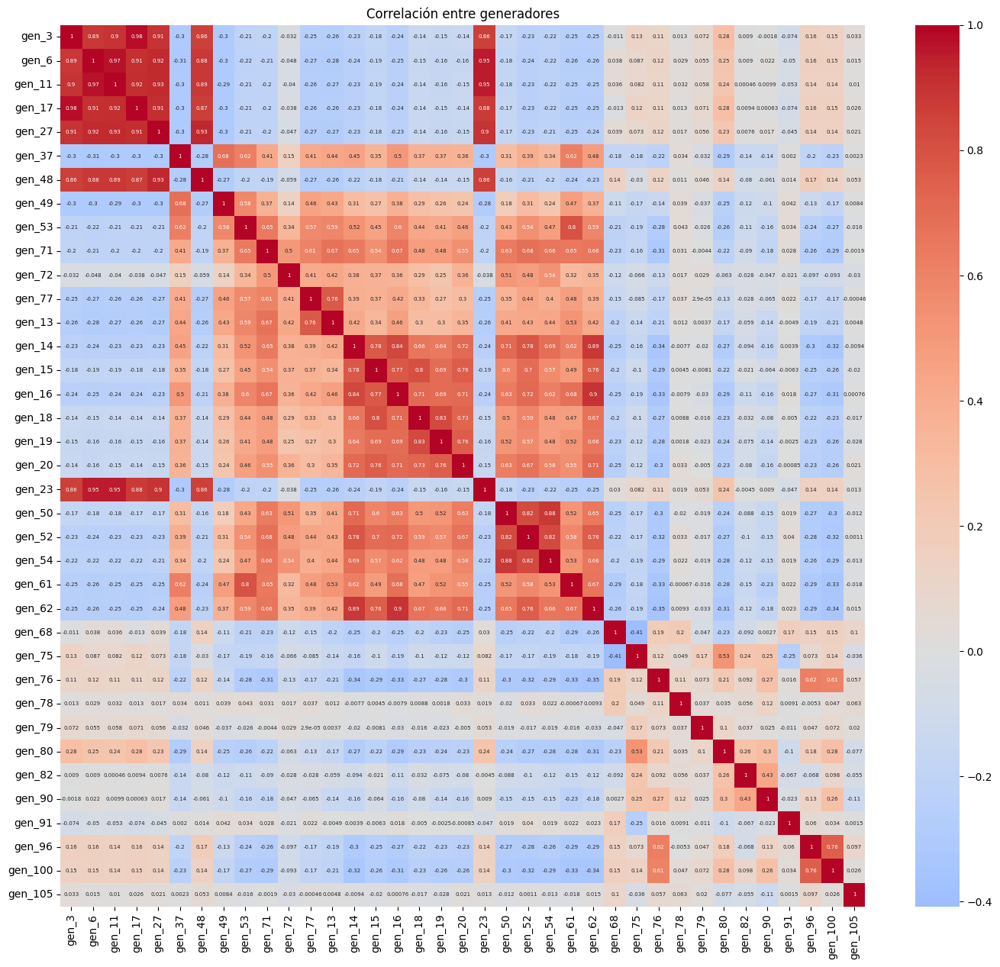

In [39]:
correlations = np.corrcoef(p_gen.T, p_gen.T)[:len(idx_sgen + idx_gen), len(idx_sgen + idx_gen):]

df_corr = pd.DataFrame(correlations, 
                       index=[f'gen_{i}' for i in idx_gen+idx_sgen],
                       columns=[f'gen_{i}' for i in idx_gen+idx_sgen])

plt.figure(figsize=(17, 15))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', center=0, annot_kws={"size": 5})
plt.title('Correlación entre generadores')
plt.show()

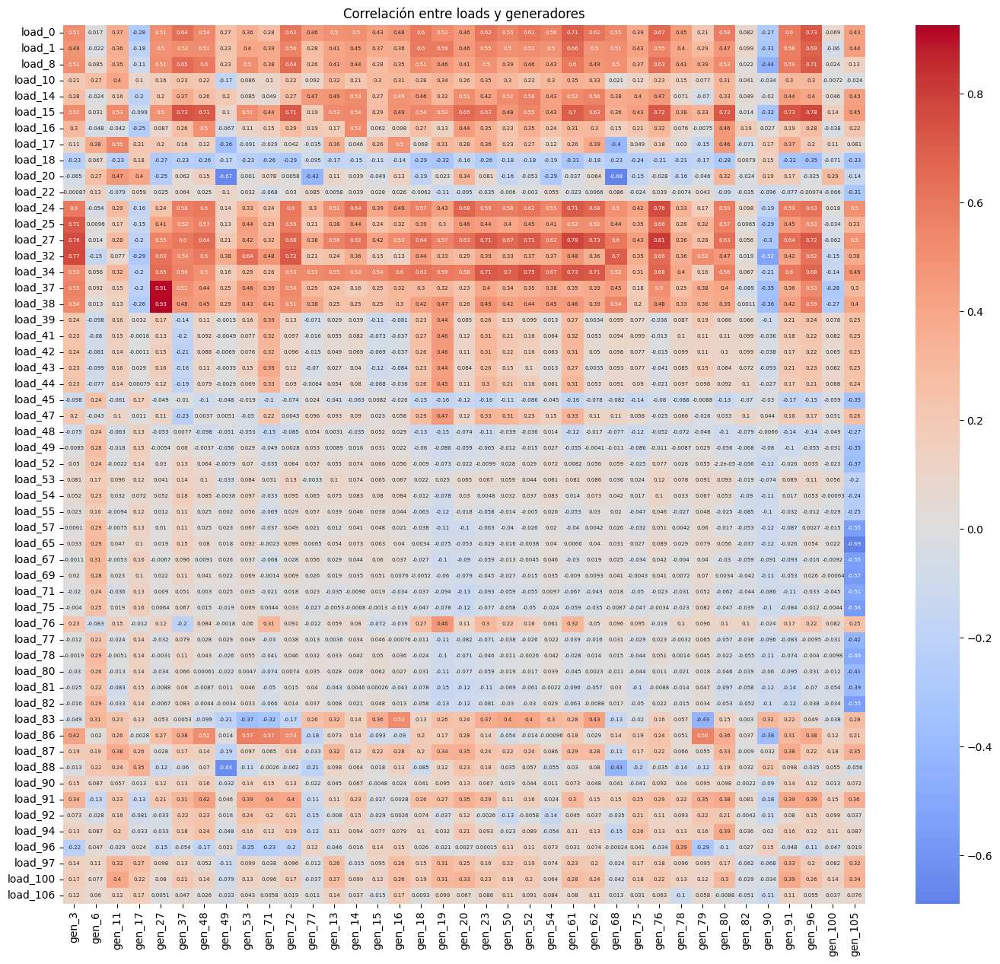

In [37]:
correlations = np.corrcoef(p_load.T, p_gen.T)[len(idx_gen+idx_sgen):, :len(idx_gen+idx_sgen)]

df_corr = pd.DataFrame(correlations, 
                       index=[f'load_{i}' for i in idx_load],
                       columns=[f'gen_{i}' for i in idx_gen+idx_sgen])

plt.figure(figsize=(17, 15))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', center=0, annot_kws={"size": 5})
plt.title('Correlación entre loads y generadores')
plt.show()